## Рынок заведений общественного питания Москвы

### Загрузка данных и изучение общей информации

In [35]:
# Загружаем необходимые библиотеки

import json
import requests
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import plotly.express as px
from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster


In [36]:
# Снимаем ограничение на количество столбцов

pd.set_option('display.max_columns', None)

In [37]:
# Загрузка данных

try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

# Загрузка геоданных

url = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
response = requests.get(url)
geo_json = response.json()


In [38]:
# Выведем основную информацию

display(data.info())
data.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


None

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В наших данных содержится 8406 записей и 14 параметров.  
Названия колонок верные.  
Тип данных в колонках  `middle_avg_bill`, `middle_coffee_cup`, `seats` надо заменить на целочисленный.   
Есть пропуски.  
Следует проверить данные на дубликаты и уникальность значений.  

### Предобработка данных

In [39]:
# Заменим тип данных в колонка `middle_avg_bill`, `middle_coffee_cup`, `seats` на целочисленный

data['middle_avg_bill'] = data['middle_avg_bill'].astype("Int64")
data['middle_coffee_cup'] = data['middle_coffee_cup'].astype("Int64")
data['seats'] = data['seats'].astype("Int64")
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   Int64  
 11  middle_coffee_cup  535 non-null    Int64  
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   Int64  
dtypes: Int64(3), float64(3), int64(1), object(7)
memory usage: 944.2+ KB


In [40]:
# Выведем уникальные значения показателя принадлежности заведения к сети

data.chain.unique()

array([0, 1])

In [41]:
# Заменим тип данных в столбце 'chain' на булевый

data['chain'] = data['chain'].astype('bool')

In [42]:
# Посчитаем количество уникальных заведений

n = len(data[['name','address']].drop_duplicates())
print(f'Количество уникальных заведений: {n}')

Количество уникальных заведений: 8406


In [43]:
# Посчитаем количество явных дубликатов 

print('Количество обнаруженных дубликатов записей: ', data.duplicated().sum())

Количество обнаруженных дубликатов записей:  0


In [44]:
# Выведем уникальные значения категорий

data.category.unique()

array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [45]:
# Посмотрим есть ли в данных заведения с одинаковыми названиями, но относящихся к разными категориями

ab = data.groupby(['name']).agg({'category':'nunique'}).reset_index().rename(columns={'category':'count'})
ab[ab['count']>1].sort_values('count', ascending=False)

,name,count
3704,Му-Му,7
2890,Кафе,7
5083,Хинкальная,5
5032,Халяль,4
3982,Пельменная,4
...,...,...
2247,Вкус востока,2
2245,Вкус Индии,2
2215,Виктория,2
2200,Верона,2


Объектов с одинаковыми названиями и разными категориями - 355. Одни и те же названия точек могут иметь разныx собственников, относится к разным категориям, а также являться сетевыми или частными объектами. Например, сеть 'Му-Му' на официально сайте именуется как сеть кафе быстрого питания, в википедии как сеть ресторанов фастфуда, и поэтому заведение можно было бы отнести к кафе, ресторану или объектам быстрого питания. Исправлять данные, на текущий момент, не представляется возможным.

Мы заметили, что есть пара неявных дубликатов Яндекс Лавки, исправим название Яндекс.Лавка на Яндекс Лавка

In [46]:
data.loc[data['name'] == 'Яндекс.Лавка', 'name'] = 'Яндекс Лавка'

In [47]:
#Исследуем данные на неявные дубликаты по названию заведения и его расположению
df_1 = data.copy()
df_1['name'] = df_1['name'].str.lower()
df_1[df_1.duplicated(subset = ['name', 'address', 'district'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,<NA>,<NA>,False,188
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,<NA>,<NA>,True,188
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,<NA>,<NA>,False,150
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,<NA>,<NA>,True,150
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,<NA>,<NA>,True,276
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,<NA>,<NA>,False,276


Обнаружили три неявных дубликата: "more poke", "раковарня клешни и хвосты" и "хлеб да выпечка", исправим это

In [48]:
data = data.drop([1430, 2211, 3109])
data = data.reset_index(drop=True)

In [49]:
df_1 = data.copy()
df_1['name'] = df_1['name'].str.lower()
df_1[df_1[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats


In [50]:
data.shape

(8403, 14)

In [51]:
# Выведем уникальные значения районов

data.district.unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [52]:
# Выведем уникальные значения рейтинга

data.rating.unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

In [53]:
# Выведем уникальные значения категории цен

data.price.unique()

array([nan, 'выше среднего', 'средние', 'высокие', 'низкие'], dtype=object)

In [54]:
# Выведем статистику среднего чека

data.middle_avg_bill.describe().to_frame()

,middle_avg_bill
count,3149.0
mean,958.053668
std,1009.732845
min,0.0
25%,375.0
50%,750.0
75%,1250.0
max,35000.0


In [55]:
# Заменим нулевые значения на NaN

data.loc[data['middle_avg_bill'] == 0, 'middle_avg_bill'] = np.nan

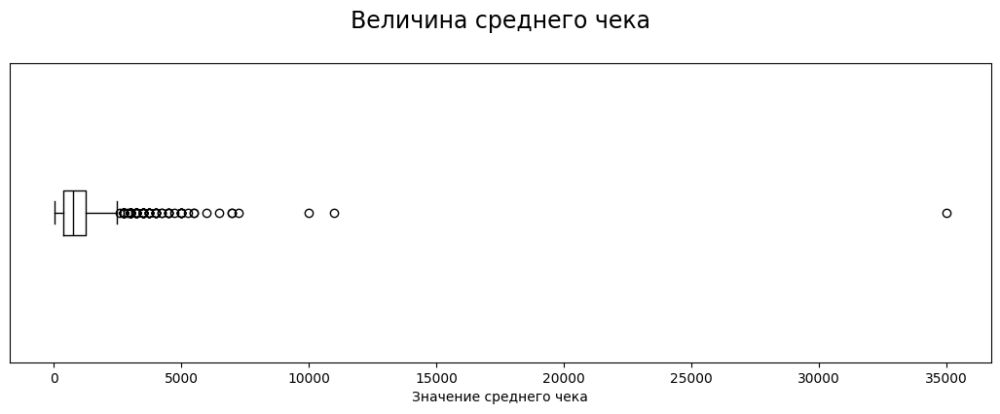

In [56]:
# Построим диаграмму размаха для среднего чека

plt.figure(figsize=(13, 4))
data.boxplot(column=['middle_avg_bill'], grid= False , color='black', vert=False)
plt.xlabel('Значение среднего чека')
plt.title('Величина среднего чека' + "\n", fontsize=17)
plt.tick_params(left = False, labelleft = False) 

In [57]:
# Выведем статистику цены чашки капучино

data.middle_coffee_cup.describe().to_frame()

,middle_coffee_cup
count,535.0
mean,174.721495
std,88.951103
min,60.0
25%,124.5
50%,169.0
75%,225.0
max,1568.0


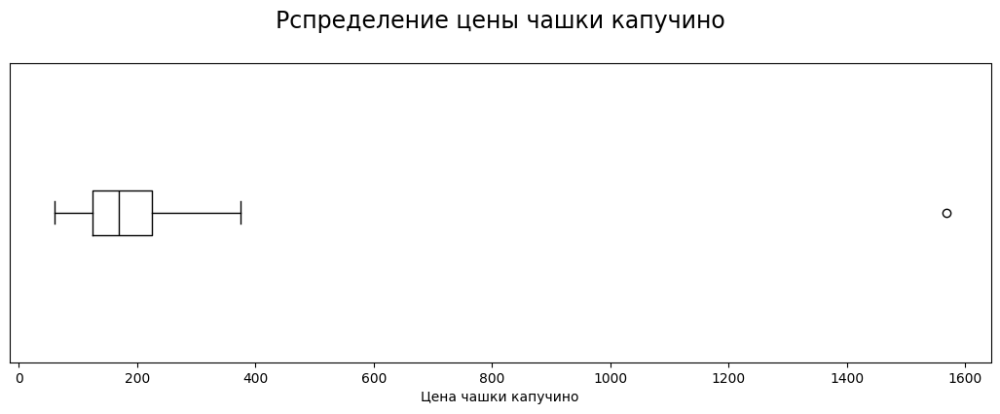

In [58]:
# Построим диаграмму размаха для цены чашки капучино

plt.figure(figsize=(13, 4))
data.boxplot(column=['middle_coffee_cup'], grid= False , color='black', vert=False)
plt.xlabel('Цена чашки капучино')
plt.title('Рспределение цены чашки капучино' + "\n", fontsize=17)
plt.tick_params(left = False, labelleft = False) 

In [59]:
# Выведем статистику числа мест в заведениях

data.seats.describe().to_frame()

,seats
count,4792.0
mean,108.361436
std,122.84113
min,0.0
25%,40.0
50%,75.0
75%,140.0
max,1288.0


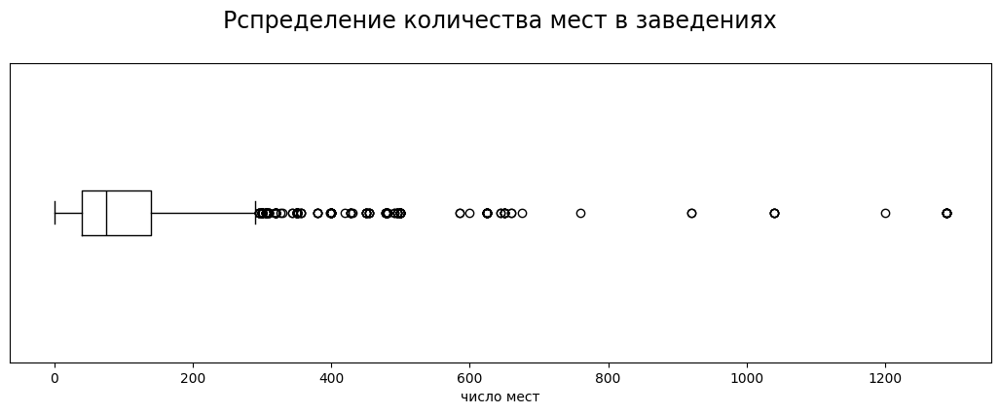

In [60]:
# Построим диаграмму размаха для числа мест в заведениях

plt.figure(figsize=(13, 4))
data.boxplot(column=['seats'], grid= False , color='black', vert=False)
plt.xlabel('число мест')
plt.title('Рспределение количества мест в заведениях' + "\n", fontsize=17)
plt.tick_params(left = False, labelleft = False) 

In [61]:
# Создадим столбец `street` с названиями улиц из столбца с адресом

data['street'] = data['address'].apply(lambda x: x.split(',')[1].strip())


Создадим столбец `is_24/7` показывающий, что заведение работает ежедневно и круглосуточно (24/7) и обозначим:
- True — если заведение работает ежедневно и круглосуточно;
- False — в противоположном случае.

In [62]:
data['is_24/7'] = data['hours'] =='ежедневно, круглосуточно'

In [63]:
data.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,seats
count,8403.000000,8403.000000,8403.000000,3148.0,535.0,4792.0
mean,55.750096,37.608604,4.229894,958.358005,174.721495,108.361436
std,0.069664,0.098583,0.470426,1009.7488,88.951103,122.84113
min,55.573942,37.355651,1.000000,30.0,60.0,0.0
25%,55.705018,37.538637,4.100000,375.0,124.5,40.0
50%,55.753407,37.605260,4.300000,750.0,169.0,75.0
75%,55.795028,37.664810,4.400000,1250.0,225.0,140.0
max,55.928943,37.874466,5.000000,35000.0,1568.0,1288.0


In [64]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8403 entries, 0 to 8402
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8403 non-null   object 
 2   address            8403 non-null   object 
 3   district           8403 non-null   object 
 4   hours              7868 non-null   object 
 5   lat                8403 non-null   float64
 6   lng                8403 non-null   float64
 7   rating             8403 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3148 non-null   Int64  
 11  middle_coffee_cup  535 non-null    Int64  
 12  chain              8403 non-null   bool   
 13  seats              4792 non-null   Int64  
 14  street             8403 non-null   object 
 15  is_24/7            8403 non-null   bool   
dtypes: Int64(3), bool(2), fl

В наших данных 8403 заведения.  
В процессе предобработки данных заменили тип данных у столбцов `middle_avg_bill`, `middle_coffee_cup`, `seats` на целочисленный, `chain` - на булевый.    
Выяснили, что есть 8 категорий заведений: 
'кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб', 'быстрое питание', 'булочная', 'столовая'.  
З55 объектов с одинаковыми названиями принадлежат к разным категориям.  
Заведения расположены в следующих 9 округах Москвы: 'Северный административный округ', 'Северо-Восточный административный округ', 'Северо-Западный административный округ', 'Западный административный округ', 'Центральный административный округ', 'Восточный административный округ', 'Юго-Восточный административный округ', 'Южный административный округ', 'Юго-Западный административный округ'.  
Рейтинг имеет диапазон от 1 до 5.  
Уникальные значения принадлежности заведения к сети: True и False.  
Уникальные значения категории цен: 'выше среднего', 'средние', 'высокие', 'низкие'.  
Средний чек имеет диапазон от 30 до 35000 руб.  Медиана среднего чека - 750 руб.  
Цена чашки капучино имеет диапазон от 60 до 1568 руб. Медиана цены по городу -  169 руб.  
Количество мест в заведении имеет диапазон от 0 до 1288. Медиана по городу составляет: 75.    
Явных дубликатов записей не обнаружено.  
Обнаружено три неявных дубликата, которые были исправлены.
В названиях точек могут присутствовать неявные дубликаты. Из-за размера данных не представляется возможном проверка на неявные дубликаты.
Дополнительно создали столбец `street` с названиями улиц из столбца с адресом, а также столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно.

### Анализ данных

#### Исследуем количество объектов общественного питания по категориям

In [65]:
df_category = data.groupby('category').agg({'category':'count'}).rename(columns={'category':'count'}).reset_index()
df_category.sort_values('count', ascending=False).reset_index(drop=True)

,category,count
0,кафе,2377
1,ресторан,2041
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


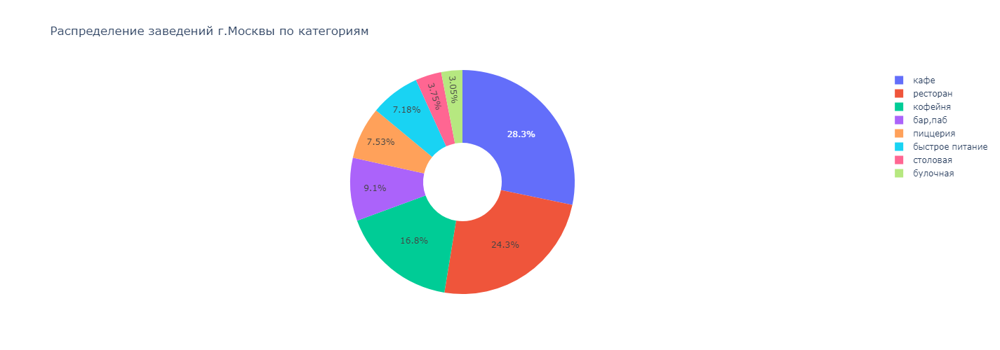

In [66]:
# Построим круговую диаграмму распределения точек общественного питания по категориям

fig = go.Figure(data=[go.Pie(labels=df_category['category'], values=df_category['count'], hole=.35, direction="clockwise")])
fig.update_layout(
        title="Распределение заведений г.Москвы по категориям",
        autosize=False,
        width=800,
        height=500)
fig.show()

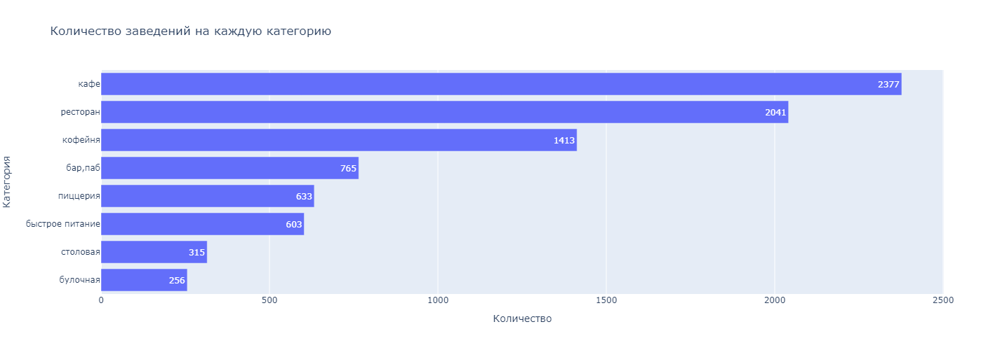

In [67]:
# Построим столбчатую диаграмму

fig = px.bar(df_category.sort_values('count'), y='category', x='count',
             text = 'count',
             title="Количество заведений на каждую категорию",
             height=500,
             width=900,
             labels={
                     "count": "Количество",
                     "category": "Категория"
                 }
            )
fig.update_traces(texttemplate='%{text}', textposition='inside')

fig.show()

Наибольшую долю среди заведений разных категорий занимают кафе с 2737 объектов или 28.3% от общего числа, на втором и третьем местах: ресторан - 2041(24.3%) и кофейня - 1413(16.8%) соответственно. Последнее место занимают булочные с 256 объектов или 3.05% от общего числа.

#### Исследуем количество посадочных мест в заведениях по категориям

In [68]:
df_category_seats = data.groupby('category')['seats'].median().reset_index()
df_category_seats.sort_values('seats', ascending=False)

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


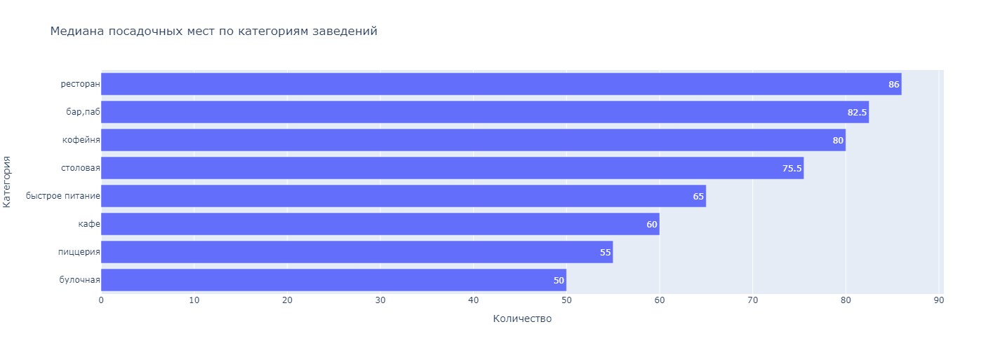

In [69]:
# Построим столбчатую диаграмму распределения точек общественного питания по категориям в разрезе количества мест

fig = px.bar(df_category_seats.sort_values('seats'), x='seats', y='category',
             text = 'seats',
             title="Медиана посадочных мест по категориям заведений",
             height=500,
             width=900,
             labels={
                     "seats": "Количество",
                     "category": "Категория"
                 }
            )
fig.update_traces(texttemplate='%{text}', textposition='inside')
fig.show()

Лидерами по количеству посадочных мест среди точек являются рестораны с 86 местами, на втором и третьем местах: бары и пабы (83) и кофейни(80) соответственно. Булочные, 50 мест, занимают последнюю строчку рейтинга.

#### Рассмотрим соотношение сетевых и несетевых заведений

In [70]:
df_net_cup = data.groupby('chain').agg({'chain':'count'}).rename(columns={'chain':'count'}).reset_index()
df_net_cup

,chain,count
0,False,5198
1,True,3205


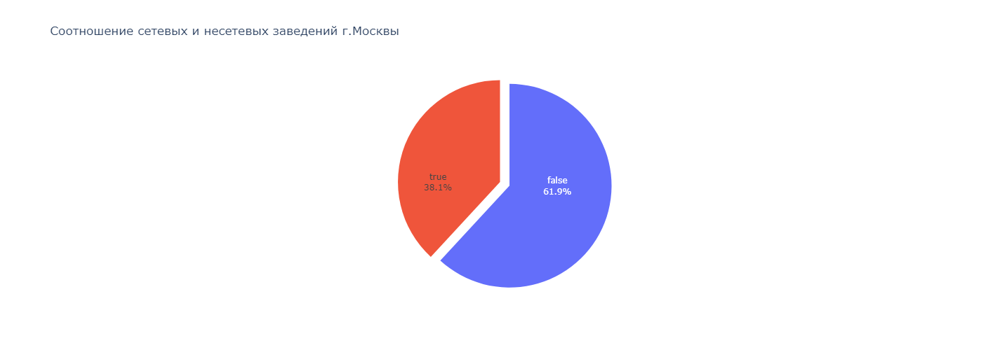

In [71]:
# Построим круговую диаграмму соотношения сетевых и несетевых заведений

fig = go.Figure(data=[go.Pie(labels=df_net_cup['chain'], 
                             values=df_net_cup['count'],  
                             textinfo='label+percent', 
                             insidetextorientation='radial',
                             pull = [0.1, 0])])
fig.update_layout(
        title="Соотношение сетевых и несетевых заведений г.Москвы",
        width=800,
        height=500,
        showlegend=False)
fig.show()

Доля несетевых заведений больше доли сетевых: 61.9% против 38.1%

#### Исследуем категории, которые чаще являются сетевыми

In [72]:
# Сгруппируем данные по категориям и вычислим соотношения сетевых и несетевых объектов

df_chain_category = data.pivot_table(index='category', columns=['chain'], values=['name'], aggfunc=['count']).reset_index()
df_chain_category.columns = ['category','non-chain', 'chain']
df_chain_category['total'] = df_chain_category['non-chain']+df_chain_category['chain']
df_chain_category ['non-chain_%'] = ((df_chain_category ['non-chain'] / df_chain_category ['total']) * 100).round(1)
df_chain_category ['chain_%'] = ((df_chain_category ['chain'] / df_chain_category ['total']) * 100).round(1)
df_chain_category = df_chain_category.sort_values('non-chain_%',  ascending=False).reset_index(drop=True)
df_chain_category

,category,non-chain,chain,total,non-chain_%,chain_%
0,"бар,паб",596,169,765,77.9,22.1
1,столовая,227,88,315,72.1,27.9
2,кафе,1598,779,2377,67.2,32.8
3,ресторан,1311,730,2041,64.2,35.8
4,быстрое питание,371,232,603,61.5,38.5
5,кофейня,693,720,1413,49.0,51.0
6,пиццерия,303,330,633,47.9,52.1
7,булочная,99,157,256,38.7,61.3


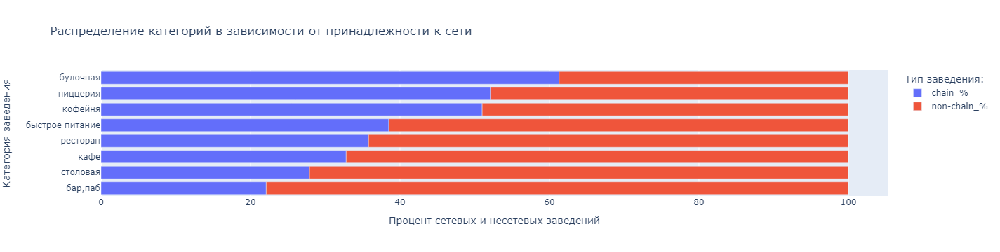

In [73]:
# Построим диаграмму

fig = px.bar(df_chain_category,
             x=['chain_%', 'non-chain_%'],
             y='category',
             title='Распределение категорий в зависимости от принадлежности к сети')

fig.update_layout(yaxis_title='Категория заведения',
                  xaxis_title='Процент сетевых и несетевых заведений',
                  legend_title='Тип заведения:')

fig.show()

Мы выяснили, что чаще всего к сетевым относятся булочные, пиццерии, кофейни. К несетевым объектам - бары, столовые, кафе. Кофейни имеет приблизительно одинаковое соотношения.

#### Найдём топ-15 популярных сетей общественного питания в Москве
Под популярностью мы будем понимать количество заведений сети в регионе

In [74]:
# Топ-15 сетевых заведений

df_top_name = data[data['chain'] == True].groupby(['name', 'category']).agg({'name':'count'}).rename(columns={'name':'count'}).reset_index()
df_top_name['cup_%'] = (100*df_top_name['count']/df_top_name['count'].sum()).round(2)
df_top_name = df_top_name.sort_values('count', ascending=False).reset_index(drop=True).head(15)
df_top_name

,name,category,count,cup_%
0,Шоколадница,кофейня,119,3.71
1,Домино'с Пицца,пиццерия,76,2.37
2,Додо Пицца,пиццерия,74,2.31
3,Яндекс Лавка,ресторан,72,2.25
4,One Price Coffee,кофейня,71,2.22
5,Cofix,кофейня,65,2.03
6,Prime,ресторан,49,1.53
7,КОФЕПОРТ,кофейня,42,1.31
8,Кулинарная лавка братьев Караваевых,кафе,39,1.22
9,Теремок,ресторан,36,1.12


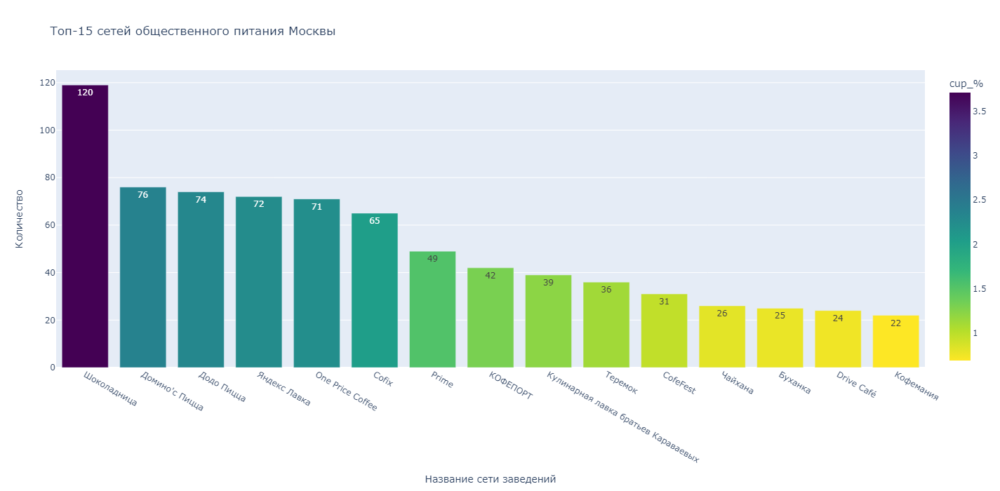

In [75]:
fig = px.bar(df_top_name, x='name', y='count',
             text='count', color='cup_%',
             title = 'Топ-15 сетей общественного питания Москвы', height=700, width=900,
             color_continuous_scale='viridis_r',
             hover_data=['category','cup_%'],
             labels={
                     "count": "Количество",
                     "name": "Название сети заведений"
                 })
fig.update_traces(texttemplate='%{text:.2s}', textposition='inside')
fig.show()

Лидером среди сетевиков является "Шоколадница" co 120 заведениями, и занимающего долю рынка сетей в 3.71% На следующих четырёх местах расположились "Домино'с Пицца","Додо пицца","Яндекс Лавка" и "One Price Coffee". Тор-15 замыкает "Кофемания" с 22 точками и долей рынка - 0.69%

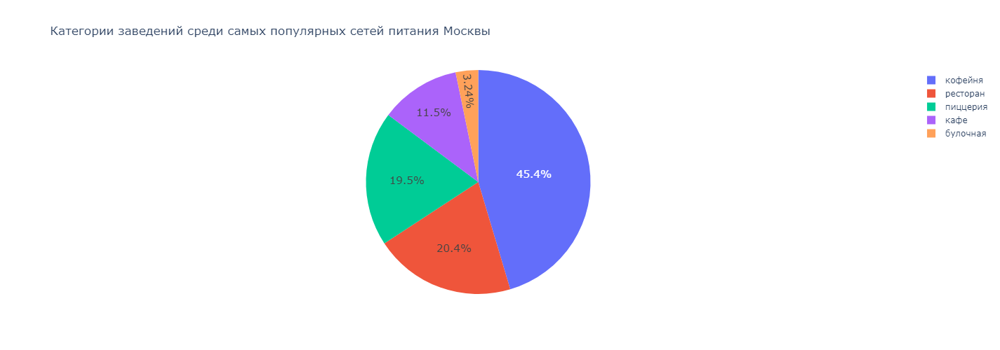

In [76]:
# Построим диаграмму самых популярных категорий заведений среди сетевиков.

fig = go.Figure(data=[go.Pie(labels=df_top_name['category'], 
                             values=df_top_name['count'], 
                             direction="clockwise",
                             textfont_size=15)])
fig.update_layout(
        title="Категории заведений среди самых популярных сетей питания Москвы",
        autosize=False,
        width=800,
        height=500)
fig.show()

Самыми распространёнными категориями заведений среди сетей являются кофейни(350), рестораны(157) и пиццерии(150). На последнем месте булочные(25).

#### Отобразим общее количество заведений и количество заведений каждой категории по округам

In [77]:
# Переименуем названия округов Москвы в аббревиатуры для удобства

rename_dict = {'Северный административный округ':'CAO',
       'Северо-Восточный административный округ':'СВАО',
       'Северо-Западный административный округ':'СЗАО',
       'Западный административный округ':'ЗАО',
       'Центральный административный округ':'ЦАО',
       'Восточный административный округ':'ВАО',
       'Юго-Восточный административный округ':'ЮВАО',
       'Южный административный округ':'ЮАО',
       'Юго-Западный административный округ':'ЮЗАО'}
new_data = data.replace({'district':rename_dict})

In [78]:
# Сгруппируем данные по округам и категориям

df_district = new_data.groupby(['district', 'category'], as_index=False).agg({'name':'count'}).rename(columns={'name':'count'})
total_counts = df_district.groupby('district')['count'].sum().sort_values(ascending=False)
df_district = df_district.set_index('district').loc[total_counts.index].reset_index()
df_district.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71
district,ЦАО,ЦАО,ЦАО,ЦАО,ЦАО,ЦАО,ЦАО,ЦАО,CAO,CAO,CAO,CAO,CAO,CAO,CAO,CAO,ЮАО,ЮАО,ЮАО,ЮАО,ЮАО,ЮАО,ЮАО,ЮАО,СВАО,СВАО,СВАО,СВАО,СВАО,СВАО,СВАО,СВАО,ЗАО,ЗАО,ЗАО,ЗАО,ЗАО,ЗАО,ЗАО,ЗАО,ВАО,ВАО,ВАО,ВАО,ВАО,ВАО,ВАО,ВАО,ЮВАО,ЮВАО,ЮВАО,ЮВАО,ЮВАО,ЮВАО,ЮВАО,ЮВАО,ЮЗАО,ЮЗАО,ЮЗАО,ЮЗАО,ЮЗАО,ЮЗАО,ЮЗАО,ЮЗАО,СЗАО,СЗАО,СЗАО,СЗАО,СЗАО,СЗАО,СЗАО,СЗАО
category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
count,364,50,87,464,428,113,670,66,68,39,58,235,193,77,188,41,68,25,85,264,131,73,202,44,63,28,82,269,159,68,181,40,50,37,62,238,150,71,218,24,53,25,71,272,105,72,160,40,38,13,67,282,89,55,145,25,38,27,61,238,96,64,168,17,23,12,30,115,62,40,109,18


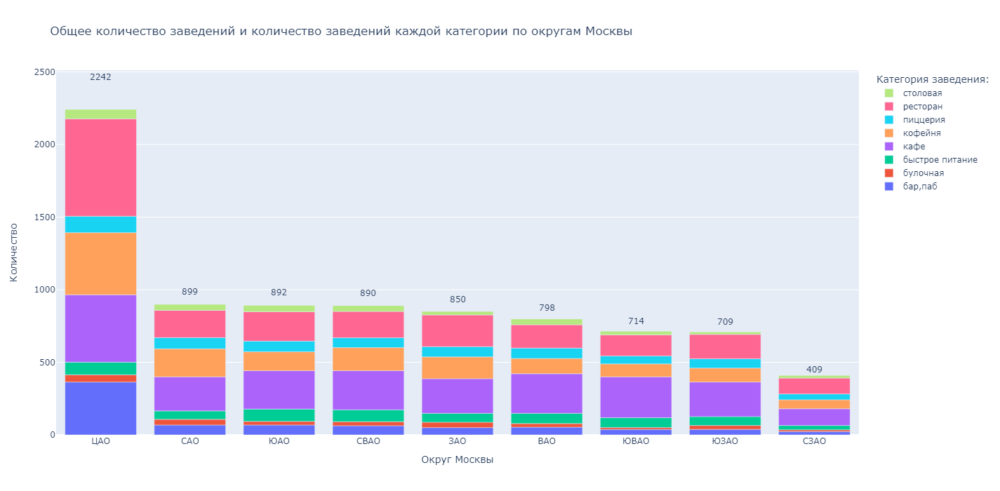

In [79]:
# Создадим диаграмму общего количества заведений и количества заведений каждой категории по округам

fig = px.bar(df_district, x='district', y='count',
            color='category',
            title = 'Общее количество заведений и количество заведений каждой категории по округам Москвы', 
            height=700, width=900,
            labels={
                     "count": "Количество",
                     "district": "Округ Москвы"
                 })
for district in df_district['district'].unique():
    fig.add_annotation(
        x=district,
        y=total_counts[district] + 0.1 * total_counts[district],
        text=str(total_counts[district]),
        showarrow=False
    )

fig.update_layout(legend_title='Категория заведения:',
                  legend_traceorder="reversed")
fig.show()


На графике видим, что Центральный административный округ лидирует по количеству заведений (2242 точек). На последнем месте Северо-Западный АО с количеством 409 точек. Такая же ситуация наблюдается по количеству точек в каждой из категорий. Можно отметить, что Западный АО находится на втором месте по числу ресторанов(218), ЮВАО - на втором месте по количеству кафе(282). Заведений быстрого  питания в ЮАО на две единицы меньше чем ЦАО.

#### Визуализируем распределение средних рейтингов по категориям заведений.

In [80]:
df_cat_rate = data.groupby('category', as_index=False).agg({'rating':'mean'})
df_cat_rate = df_cat_rate.sort_values('rating', ascending=False).reset_index(drop=True)
df_cat_rate

,category,rating
0,"бар,паб",4.387712
1,пиццерия,4.301264
2,ресторан,4.290348
3,кофейня,4.277282
4,булочная,4.268359
5,столовая,4.211429
6,кафе,4.123896
7,быстрое питание,4.050249


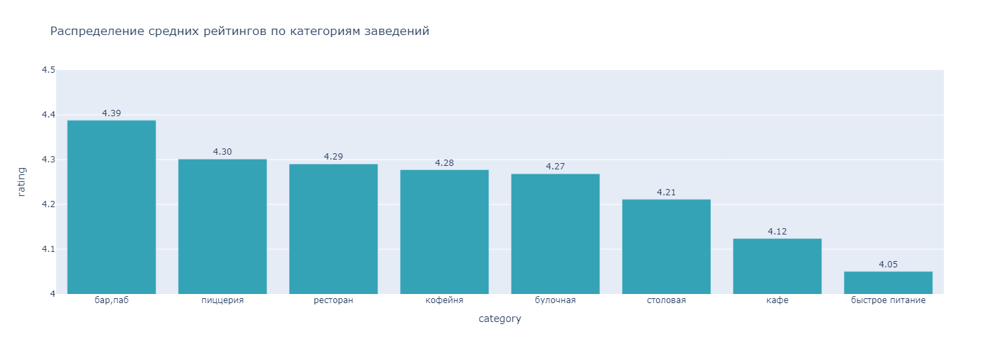

In [81]:
fig = px.bar(df_cat_rate, x='category', y='rating',
             text="rating",
             title = 'Распределение средних рейтингов по категориям заведений', height=500, width=900)
fig.update_traces(marker_color='#34A3B6')

fig.update_layout(yaxis=dict(range=[4, 4.5]))
fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
fig.show()

Наибольший рейтинг у баров и пабов, наименьший у категории быстрого питания. Рейтинги остальных категорий не сильно отличаются друг от друга.

#### Построим хороплет со средним рейтингом заведений каждого района.

In [82]:
# Сгруппируем данные по округам и найдём средний рейтинг

df_dist_rate = data.groupby(['district'], as_index=False).agg({'rating':'mean'})
df_dist_rate = df_dist_rate.sort_values('rating', ascending=False).reset_index(drop=True)
df_dist_rate

,district,rating
0,Центральный административный округ,4.377520
1,Северный административный округ,4.239822
2,Северо-Западный административный округ,4.208802
3,Южный административный округ,4.184417
4,Западный административный округ,4.181647
5,Восточный административный округ,4.174185
6,Юго-Западный административный округ,4.172920
7,Северо-Восточный административный округ,4.147978
8,Юго-Восточный административный округ,4.101120


In [83]:
moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geo_json,
    data=df_dist_rate,
    columns=['district', 'rating'],
    locations='district',
    hover_data=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Наивысший рейтинг занимает Центральный округ.  
Следом идут Северный и Северо-Западный округа.  
Южный, Западный, Восточный и Юго-Западный округа имеют примерно одинаковый рейтинг.  
Далее идёт Северо-Восточный округ.  
Наименьший рейтинг у заведений находящихся в Юго-Восточном округе.

#### Отобразим все заведения датасета на карте с помощью кластеров

In [84]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} Rating:{row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

Видна концентрация заведений в центральном районе Москвы

#### Найдём топ-15 улиц по количеству заведений

In [85]:
# Сгруппируем данные по названию улиц и выберем 15 самых больших по количеству заведений.

df_str = data.groupby(['street', 'category'], as_index=False).agg({'name':'count'}).rename(columns={'name':'count'})
total_str_counts = df_str.groupby('street')['count'].sum().sort_values(ascending=False).head(15)
df_top_str = df_str.set_index('street').loc[total_str_counts.index].reset_index()
df_top_str.head(10)

,street,category,count
0,проспект Мира,"бар,паб",12
1,проспект Мира,булочная,4
2,проспект Мира,быстрое питание,21
3,проспект Мира,кафе,53
4,проспект Мира,кофейня,36
5,проспект Мира,пиццерия,11
6,проспект Мира,ресторан,44
7,проспект Мира,столовая,2
8,Профсоюзная улица,"бар,паб",6
9,Профсоюзная улица,булочная,4


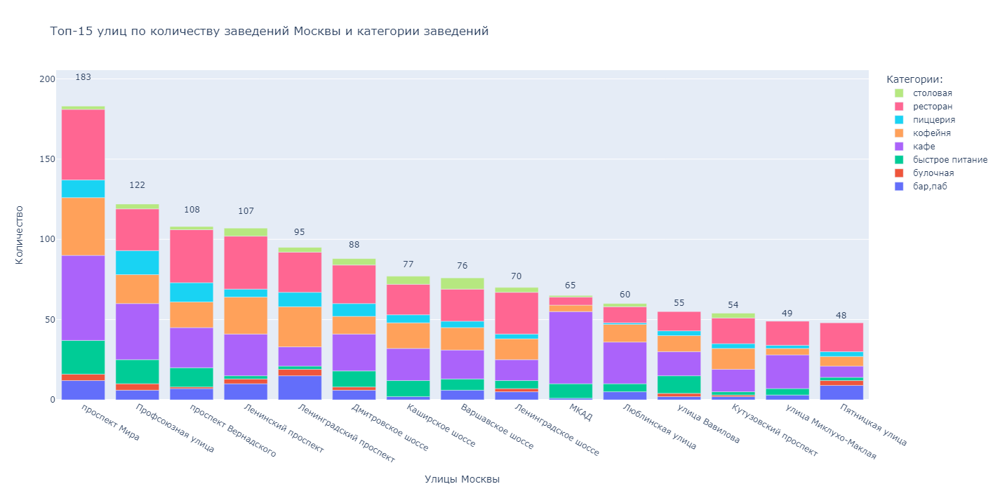

In [86]:
# Создадим диаграмму общего количества заведений и количества заведений каждой категории по улицам

fig = px.bar(df_top_str, x='street', y='count',
            color='category',
            title = 'Топ-15 улиц по количеству заведений Москвы и категории заведений', 
            height=700, width=900,
            labels={
                     "count": "Количество",
                     "street": "Улицы Москвы"
                 })

for street in df_top_str['street'].unique():
    fig.add_annotation(
        x=street,
        y=total_str_counts[street] + 0.1 * total_str_counts[street],
        text=str(total_str_counts[street]),
        showarrow=False
    )

fig.update_layout(legend_title='Категории:',
                  legend_traceorder="reversed")

fig.show()

По количеству заведений первое место занимает проспект Мира. На последнем месте среди топ-15 находится Пятницкая улица.  
Важно отметить несколько интересных моментов.  
Профсоюзная улица является лидером по количеству пиццерий.  
Ленинградский проспект и проспект Мира равны по количеству булочных, в то же время первый обгоняет последнего по числу баров и пабов.  
По количеству кафе после проспекта Мира выделяется МКАД.  

#### Найдём улицы, на которых находится только один объект общепита.

In [87]:
single_str = data.groupby(['street']).agg({'name':'count'}).rename(columns={'name':'count'}).reset_index()
single_str = single_str[single_str['count']==1]
df_one_street = single_str.merge(data, on='street', how='left')
df_one_street.tail()

,street,count,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,is_24/7
453,улица Шкулёва,1,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,<NA>,<NA>,False,90,False
454,улица Шкулёва 4,1,CofeFest,кофейня,"Москва, улица Шкулёва 4",Юго-Восточный административный округ,пн-пт 08:00–19:00,55.693299,37.749927,4.4,NaN,NaN,<NA>,<NA>,True,<NA>,False
455,улица Шухова,1,Scirocco,ресторан,"Москва, улица Шухова, 21",Южный административный округ,"ежедневно, 12:00–00:00",55.716123,37.608472,4.1,высокие,Средний счёт:2500–3500 ₽,3000,<NA>,False,90,False
456,улица Юннатов,1,Кафе-столовая,столовая,"Москва, улица Юннатов, 18",Северный административный округ,пн-пт 08:30–17:30,55.802610,37.558759,4.7,средние,Средний счёт:250–400 ₽,325,<NA>,False,27,False
457,№ 7,1,Енот,кафе,"Москва, № 7",Южный административный округ,NaN,55.679064,37.615015,4.8,NaN,NaN,<NA>,<NA>,False,<NA>,False


В ходе анализа мы обнаружили, что улица Шкулёва имеет два неявных дублика

In [88]:
data.loc[data['street'] == "улица Шкулёва 4", 'street'] = "улица Шкулёва"

In [89]:
single_str = data.groupby(['street']).agg({'name':'count'}).rename(columns={'name':'total'}).reset_index()
single_str = single_str[single_str['total']==1]
df_one_street = single_str.merge(data, on='street', how='left')

In [90]:
print(f'Всего улиц с одним объектом общепита: {len(df_one_street)}')

df_one_cat = df_one_street['category'].value_counts().to_frame().reset_index()
df_one_cat.columns = ['category','count']
df_one_cat

Всего улиц с одним объектом общепита: 456


,category,count
0,кафе,160
1,ресторан,92
2,кофейня,83
3,"бар,паб",39
4,столовая,36
5,быстрое питание,23
6,пиццерия,15
7,булочная,8


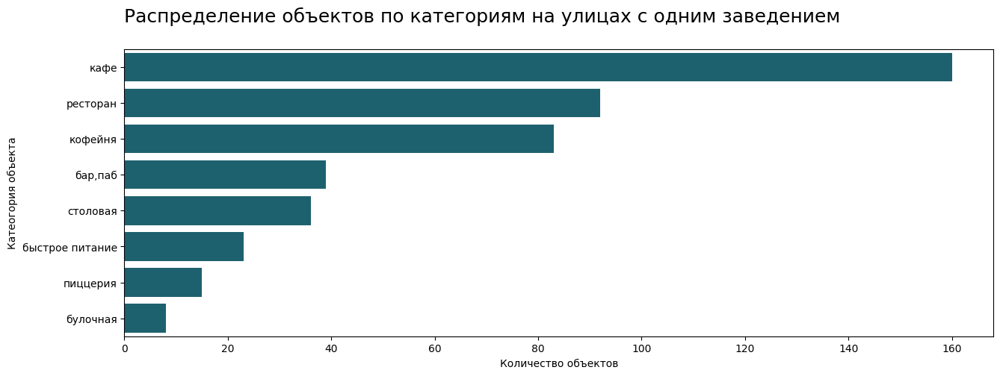

In [91]:
# Построим диаграмму распределения категорий на улицах с одним заведением

plt.figure(figsize=(15, 5))
ax = sns.barplot(x='count', y='category', data=df_one_cat, color='#116A7B')
ax.set_title('Распределение объектов по категориям на улицах с одним заведением'+ "\n", fontsize=18, loc='left')
ax.set_xlabel('Количество объектов') 
ax.set_ylabel('Катеогория объекта')
plt.show()

На улицах с одним заведением чаще встречаются кафе, рестораны и кофейни, реже - булочные

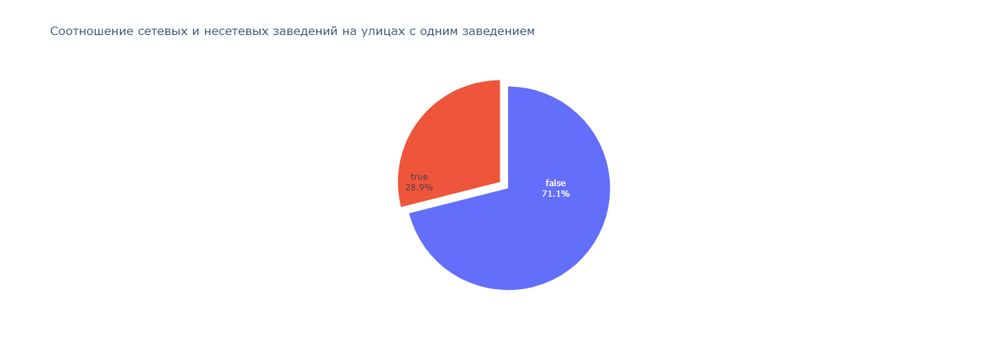

In [92]:
# Узнаем каких больше объектов: сетевых или несетвых на улицах с одним объектом общепита

df_one_net = df_one_street['chain'].value_counts().reset_index()
df_one_net.columns = ['chain','count']

# Построим круговую диаграмму соотношения сетевых и несетевых заведений

fig = go.Figure(data=[go.Pie(labels=df_one_net['chain'], 
                             values=df_one_net['count'],  
                             textinfo='label+percent', 
                             insidetextorientation='radial',
                             pull = [0.1, 0])])
fig.update_layout(
        title="Соотношение сетевых и несетевых заведений на улицах с одним заведением",
        width=800,
        height=500,
        showlegend=False)
fig.show()

Несетевых заведений значительно больше сетевых на улицах с одной точкой общественного питания

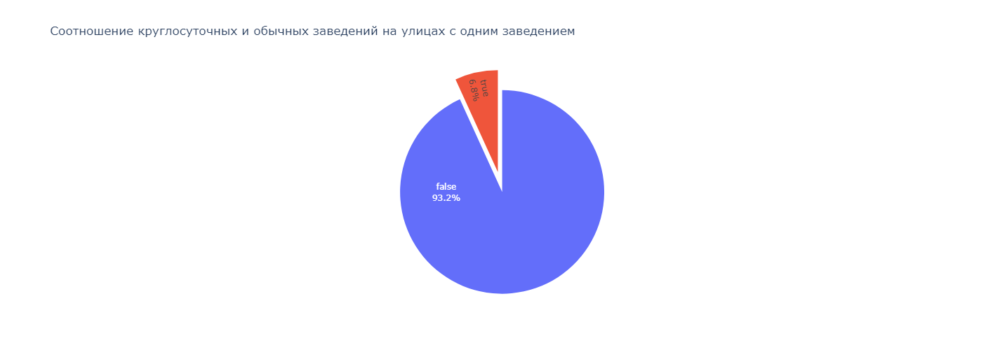

In [93]:
# Выясним режим работы заведений на улицах с одним объектом

df_one_net = df_one_street['is_24/7'].value_counts().reset_index()
df_one_net.columns = ['is_24/7','count']

# Построим круговую диаграмму соотношения круглосуточных и обычных заведений

fig = go.Figure(data=[go.Pie(labels=df_one_net['is_24/7'], 
                             values=df_one_net['count'],  
                             textinfo='label+percent', 
                             insidetextorientation='radial',
                             pull = [0.1, 0.1])])
fig.update_layout(
        title="Соотношение круглосуточных и обычных заведений на улицах с одним заведением",
        width=800,
        height=500,
        showlegend=False)
fig.show()

Круглосуточных заведений всего 7% от общего числа заведений на улицах с одним объектом

In [94]:
# Узнаем в каких округах чаще встречаются улицы с одним заведением

df_one_district = df_one_street.groupby(['district']).agg({'name':'count'}).rename(columns={'name':'count'}).reset_index()
df_one_district = df_one_district.sort_values('count', ascending=False)
df_one_district 

,district,count
5,Центральный административный округ,145
3,Северо-Восточный административный округ,55
0,Восточный административный округ,52
2,Северный административный округ,52
8,Южный административный округ,43
6,Юго-Восточный административный округ,37
1,Западный административный округ,35
4,Северо-Западный административный округ,19
7,Юго-Западный административный округ,18


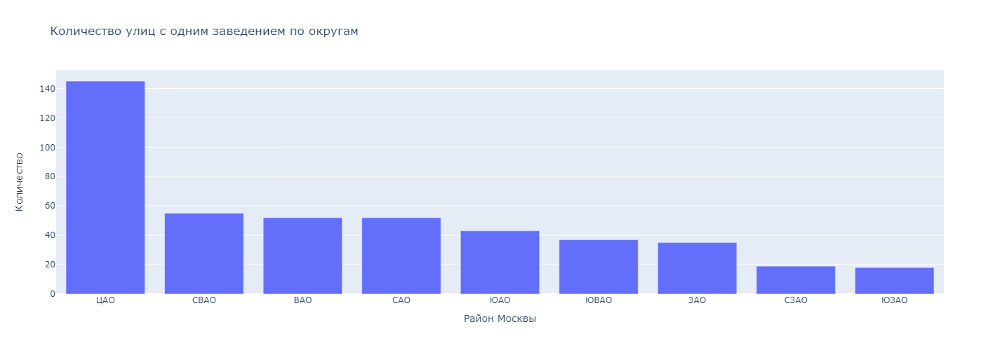

In [95]:
# Построим диаграмму распределения улиц по округам

df_one_district = df_one_district.replace({'district':rename_dict})

fig = px.bar(df_one_district, y='count', x='district',
            title="Количество улиц с одним заведением по округам", height=500, width=900,
            labels={
                     "count": "Количество",
                     "district": "Район Москвы"
                 })
fig.update_traces(textfont_size=12)
fig.show()

В ЦАО 145 улиц с одной точкой общественного питания. В ЮЗАО таких - 18

#### Посчитаем медиану средних чеков заведений для каждого района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района.

In [96]:
# Сгруппируем данные по округам и найдём медиану средних чеков

df_median_bill = data.groupby('district').agg({'middle_avg_bill':'median'}).rename(columns={'middle_avg_bill':'median_bill'}).reset_index()
df_median_bill = df_median_bill.sort_values('median_bill', ascending=False)
df_median_bill_short = df_median_bill.replace({'district':rename_dict})
df_median_bill_short

,district,median_bill
1,ЗАО,1000.0
5,ЦАО,1000.0
4,СЗАО,700.0
2,CAO,650.0
7,ЮЗАО,600.0
0,ВАО,575.0
3,СВАО,500.0
8,ЮАО,500.0
6,ЮВАО,450.0


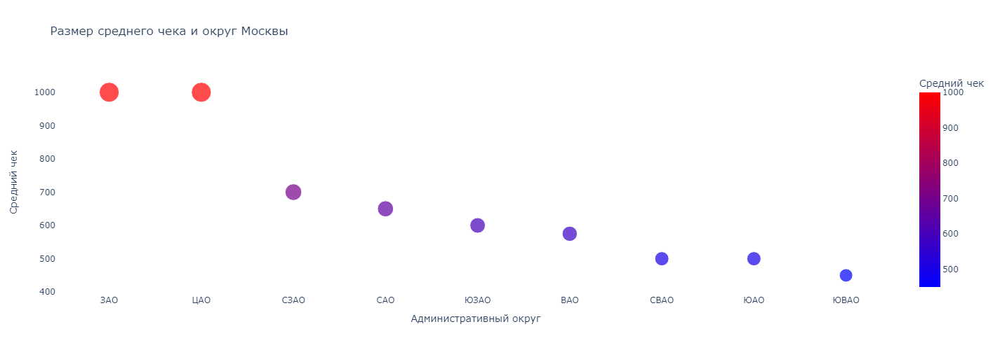

In [97]:
# создаем пузырьковую диаграмму

fig = px.scatter(df_median_bill_short, 
                 x="district", 
                 y="median_bill",
                 height=500, width=900,
                 size=(df_median_bill_short['median_bill']).to_list(),
                 color = "median_bill",
                 color_continuous_scale="Bluered",
                 title="Размер среднего чека и округ Москвы", 
                 labels={"district": "Административный округ", "median_bill": "Средний чек"})
fig.update_layout(plot_bgcolor='RGB(255,255,255)')
fig.show()

In [98]:
# Создаём хороплет

moscow_lat, moscow_lng = 55.751244, 37.618423

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

Choropleth(
    geo_data=geo_json,
    data=df_median_bill,
    columns=['district', 'median_bill'],
    locations='district',
    hover_data=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Медиана средних чеков по округам Москвы',
).add_to(m)

m

Западный и Центральный округа характеризует высокий показатель среднего чека - 1000 руб.  
Северо-Западный, Серверный, Юго-Западный имеют средний чек порядка 600-700 руб.  
С другой стороны, на востоке, размер среднего чека более умеренный: 500-600 руб. Сюда входят Восточный, Северо-Восточный и Южный округа.  
Если голоден, а денег не так много, то добро пожаловать в Юго-Восточный АО. Здесь размер среднего чека всего 450 рублей.

#### Исследуем часы работы заведений и их зависимость от расположения и категории заведения.

In [99]:
time_dict = {True:'Круглосуточный', False:'Ограниченный'}

df_time_dist = data.pivot_table(index=['district','is_24/7'], values='name', aggfunc={'name':'count'}).reset_index()
df_time_dist.columns = ['district', 'is_24/7', 'count']
df_time_dist = df_time_dist.sort_values(['count', 'district'], ascending=False)
df_time_dist = df_time_dist.replace({'district':rename_dict, 'is_24/7':time_dict})
df_time_dist

,district,is_24/7,count
10,ЦАО,Ограниченный,2111
4,CAO,Ограниченный,828
16,ЮАО,Ограниченный,817
6,СВАО,Ограниченный,815
2,ЗАО,Ограниченный,778
0,ВАО,Ограниченный,701
14,ЮЗАО,Ограниченный,636
12,ЮВАО,Ограниченный,621
8,СЗАО,Ограниченный,366
11,ЦАО,Круглосуточный,131


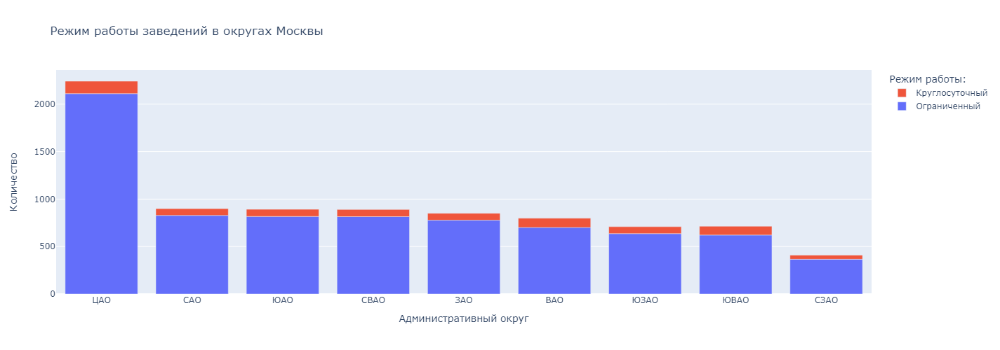

In [100]:
fig = px.bar(df_time_dist, x='district', y='count',
            color='is_24/7',
            title = 'Режим работы заведений в округах Москвы', 
            height=500, width=900,
            labels={
                     "count": "Количество",
                     "district": "Административный округ"
                 })
fig.update_layout(legend_title='Режим работы:',
                  legend_traceorder="reversed")
fig.show()

Круглосуточные заведения чаще располагаются в Центральном, Восточном и Юго-Восточном административных округа.  
Меньше всего круглосуточных заведений в Северо-Западном округе.

In [101]:
df_time_cat = data.pivot_table(index=['category', 'is_24/7'], values='name', aggfunc={'name':'count'}).reset_index()
df_time_cat.columns = ['category', 'is_24/7', 'count']
df_time_cat = df_time_cat.sort_values(['count', 'category'], ascending=False)
df_time_cat = df_time_cat.replace({'is_24/7':time_dict})
df_time_cat

,category,is_24/7,count
6,кафе,Ограниченный,2110
12,ресторан,Ограниченный,1906
8,кофейня,Ограниченный,1354
0,"бар,паб",Ограниченный,713
10,пиццерия,Ограниченный,602
4,быстрое питание,Ограниченный,453
14,столовая,Ограниченный,303
7,кафе,Круглосуточный,267
2,булочная,Ограниченный,232
5,быстрое питание,Круглосуточный,150


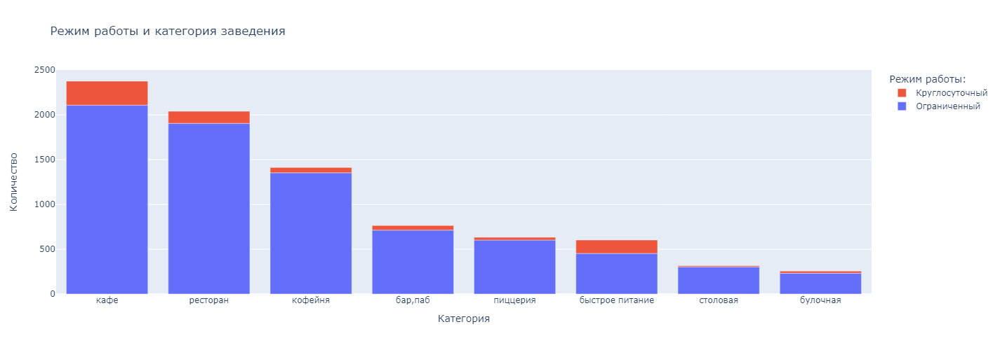

In [102]:
fig = px.bar(df_time_cat, x='category', y='count',
            color='is_24/7',
            title = 'Режим работы и категория заведения', 
            height=500, width=900,
            labels={
                     "count": "Количество",
                     "category": "Категория"
                 })
fig.update_layout(legend_title='Режим работы:',
                  legend_traceorder="reversed")
fig.show()

Как мы видим наибольшее число круглосуточных заведений относится к категориям: кафе, быстрого питания и ресторанов.  
Столовые, булочные и пиццерии редко работают круглые сутки.

#### Исследуем рейтинги заведений в разрезе средних чеков и категорий заведений.

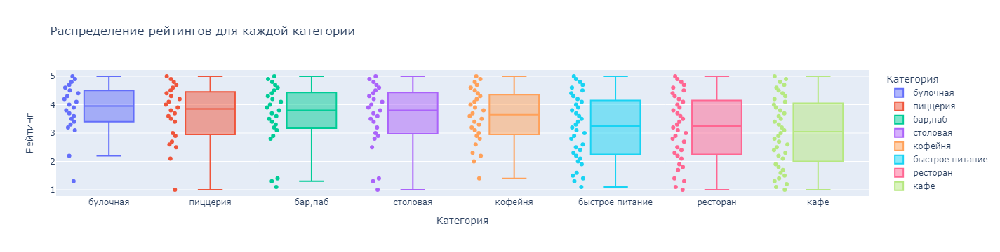

In [103]:
# Построим диаграмму типа "ящик с усами" для отображения распределения рейтинга и категории заведения

df_cat_raiting = data.groupby(['category', 'rating']).agg({'rating':'count'}).rename(columns={'rating':'count'}).reset_index()
df_cat_raiting['median'] = df_cat_raiting.groupby('category')['rating'].transform('median')
df_cat_raiting = df_cat_raiting.sort_values('median', ascending=False)


fig = px.box(df_cat_raiting,
             title = 'Распределение рейтингов для каждой категории',  
             x="category", 
             y="rating",
             color="category", 
             points="all", 
             hover_data=['category','rating','count'],
             labels={
                     "rating": "Рейтинг",
                     "category": "Категория"
                 }
             )
fig.show()

Самый высокий медианный рейтинг у булочных и пиццерий. Самый низкий - у кафе, ресторанов и заведений быстрого питания. Талже мы видим, что наибольшее число оценок у кафе, ресторанов и заведений быстрого питания, наименьшее у булочных пицерий и баров.

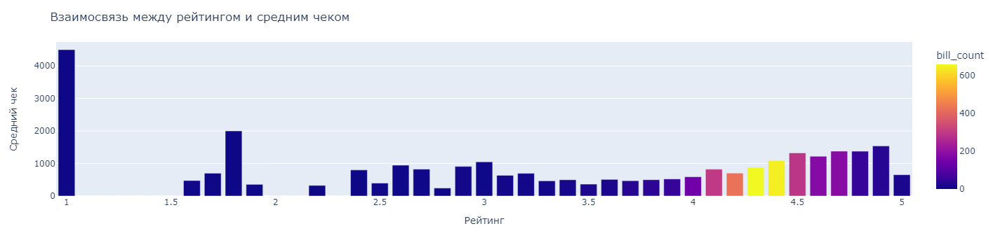

In [104]:
# Построим диаграмму для отображения рейтинга и размера среднего чека заведения

df_bill_rating = data.pivot_table(index=['rating'], 
                                  values='middle_avg_bill',
                                  aggfunc=['mean','count']).reset_index()
df_bill_rating.columns = ['rating','bill_mean','bill_count']
df_bill_rating = df_bill_rating.fillna(0)

fig = px.bar(df_bill_rating, 
             x='rating', 
             y='bill_mean', 
             hover_data=['rating', 'bill_mean', 'bill_count'],
             color='bill_count'
             )

fig.update_layout(
    title='Взаимосвязь между рейтингом и средним чеком',
    xaxis_title='Рейтинг',
    yaxis_title='Средний чек'
)

fig.show()

Если рассмотреть рейтинг между 1 и 3,5, то можно заметить, как средний чек снижается с ростом рейтинга. Но после 3,5 и до 5 видим, что средний чек повышается с 365 руб до 1,537 руб. Возможно на низкий рейтинг влияет недостаточное число оценок, которые ставили посетители, т.к. в районе 4,3 балла их более 600, а в области низкого рейтинга их число не превышает десятка на каждый балл. Но можно сказать однозначно - с ростом рейтинга средний чек повышается.

#### Общий итог

В результате анализа данных мы пришли к следующим выводам.
- В Москве насчитывается 8403 заведений общественного питания.
- Больше половины всех заведений Москвы приходится на кафе и рестораны. Кофейни тоже пользуются достаточной популярностью. Наименьшим числом представлены булочные и столовые.
- Больше всех посадочных мест имеют рестораны, бары и пабы, кофейни. Меньше - у кафе, булочных и пиццерий. Столовые и объекты быстрого питания имею среднее количество мест среди всех категорий заведений.
- Заведения несетевого типа представлены в большем объёме, их 5198. Заведений частного характера - 3205.
- К сетевым заведениям чаще относятся булочные, пиццерии и кофейни. В меньшей степени - точки быстрого питания, рестораны и кофе. Столовые и бары редко являются сетевыми.
- К самым многочисленным заведениям сетевого типа относятся такие бренды как: 
	- Шоколадница (3.71%),
	- Домино'с пицца (2.37%),
	- Додо пицца (2.31%),
	- Яндекс Лавка (2.25%),
	- One Price Coffee (2.22%).
Кофейни, рестораны и пиццерии - самые многочисленные категории сетевого бизнеса.
- В датасете присутствуют все 9 округов Москвы. В ЦАО находится самое большое число заведений(2242). Наименьшее количество в СЗАО(409). В остальных округа диапазон значений от 700 до 900 объектов. ЦАО лидирует во всех категориях. На втором месте по категории ресторанов занимает ЗАО, по категории кафе - ЮВАО, по категории быстрого питания - ЮАО.
- Наибольший рейтинг у баров, пабов, наименьший у категории быстрого питания. Рейтинги остальных категорий не сильно отличаются друг от друга.
- Мы построили фоновую картограмму и выяснили, что самый высокий рейтинг у Центрального округа. Следом идут Северный и Северо-Западный округа.  Южный, Западный, Восточный и Юго-Западный округа имеют примерно одинаковый рейтинг. Далее идёт Северо-Восточный округ. Наименьший рейтинг у заведений находящихся в ЮВАО.
- Мы отобразили все заведения датасета на карте с помощью кластеров средствами библиотеки folium и убедились в концентрации основной массы заведений в ЦАО.
- Проспект Мира является самой популярной улицей по количеству мест общественного питания (183). Далее следуют: Профсоюзная улица(122), Проспект Вернадского(108), Ленинский проспект(107), Ленинградский проспект(95). Профсоюзная улица является лидером по количеству пиццерий. Ленинградский проспект и проспект Мира равны по количеству булочных, в то же время первый обгоняет последнего по числу баров и пабов. По количеству кафе после проспекта Мира выделяется МКАД. 
- Всего улиц с одним объектом общепита - 456. Чаще всего на них располагаются кафе, рестораны и кофейни. Реже пиццерии и булочные. Несетевых типов заведений больше(71,1%). Круглосуточных объектов всего 7% от общего числа. Улицы с одним заведением чаще встречаются в ЦАО, почти в три раза больше чем в остальных. Намного меньше таких улиц в ЮЗАО.
- С помощью хороплета мы наглядно представили распределение медиан средних чеков для каждого района. Западный и Центральный округа характеризует высокий показатель среднего чека - 1000 руб.  СЗАО, САО, ЮЗАО имеют средний чек порядка 600-700 руб. Восточный, Северо-Восточный и Южный округа имеют средний чек 500-600 руб. Самый низкий, 450 руб, в ЮВАО. Можно сказать однозначно, что при удалении от центра размер среднего чека уменьшается.
- Круглосуточные заведения чаще располагаются в Центральном, Восточном и Юго-Восточном административных округа.  Меньше всего круглосуточных объектов в Северо-Западном округе. Большее количество круглосуточных заведений относится к категориям: кафе, быстрого питания и ресторанов. Столовые, булочные и пиццерии редко работают круглые сутки.
- Булочные и пиццерии обладают наивысшим медианным рейтингом, в то время как кафе, рестораны и заведения быстрого питания имеют наименьший. Кроме того, мы видим, что кафе, рестораны и заведения быстрого питания получают наибольшее количество оценок, в то же время люди неохотно дают оценки булочным, пиццериям и барам.
- Мы выяснили, что с увеличением рейтинга средний чек также увеличивается.

### Детализируем исследование: открытие кофейни

In [105]:
# Выведем статистику данных относительно категории кофейни

data_cof = data.query('category == "кофейня"')

data_cof.describe()[['rating','middle_avg_bill','middle_coffee_cup','seats']]

,rating,middle_avg_bill,middle_coffee_cup,seats
count,1413.000000,199.0,521.0,751.0
mean,4.277282,617.296482,175.055662,111.199734
std,0.372250,500.437342,89.753009,127.837772
min,1.400000,50.0,60.0,0.0
25%,4.100000,300.0,124.0,40.0
50%,4.300000,400.0,170.0,80.0
75%,4.400000,750.0,225.0,144.0
max,5.000000,2500.0,1568.0,1288.0


Среди всех заведений общественного питания доля кофеин составляет 16.8% или 1413 точек, это третья по численности категория объектов после кафе и ресторанов.

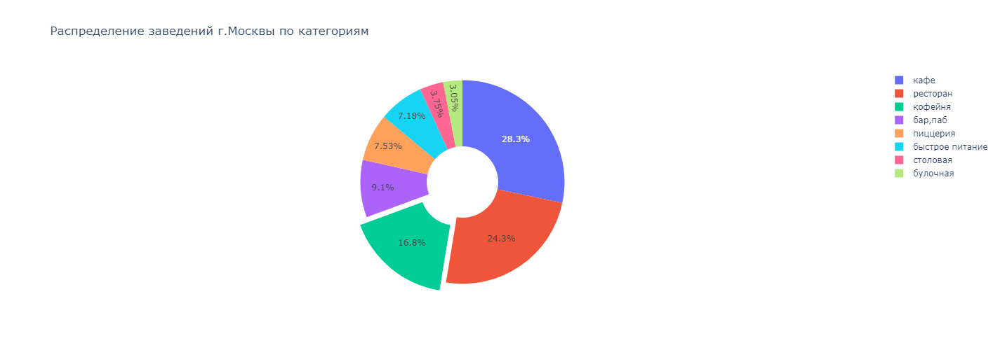

In [106]:
# Построим круговую диаграмму распределения точек общественного питания по категориям

fig = go.Figure(data=[go.Pie(labels=df_category['category'], 
                             values=df_category['count'], 
                             hole=.35, direction="clockwise",
                             pull=[ 0, 0, 0, 0, 0.1])])
fig.update_layout(
        title="Распределение заведений г.Москвы по категориям",
        autosize=False,
        width=800,
        height=500)
fig.show()

Топ - 3 округов Москвы по количеству кофеин: 
- ЦАО(428точек), 
- САО(193), 
- СВОА(159)

Меньше всего кофеин в СЗАО(62 точки)

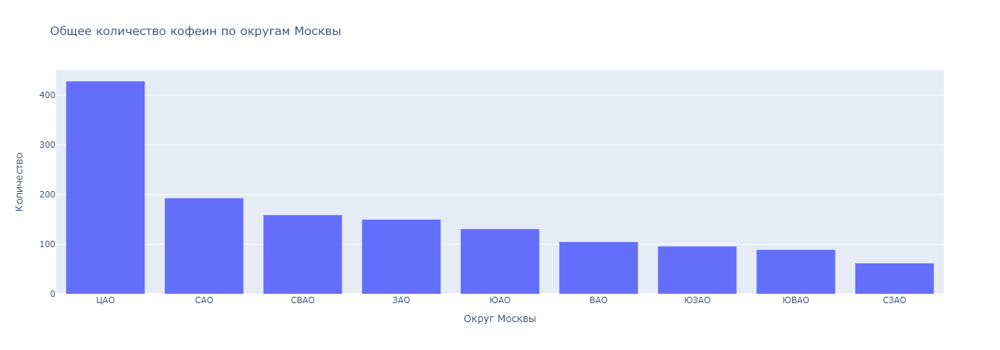

In [107]:
fig = px.bar(df_district.query("category == 'кофейня'").sort_values('count', ascending=False), x='district', y='count',
            color='category',
            title = 'Общее количество кофеин по округам Москвы', 
            height=500, width=900,
            labels={
                     "count": "Количество",
                     "district": "Округ Москвы"
                 })
fig.update_layout(showlegend=False)
fig.show()

Только 4% всех кофеин круглосуточные.

In [108]:
cof = df_time_cat.query("category == 'кофейня'").copy()
cof.loc[:, 'cup'] = 100 * cof['count']/cof['count'].sum()
cof

,category,is_24/7,count,cup
8,кофейня,Ограниченный,1354,95.824487
9,кофейня,Круглосуточный,59,4.175513


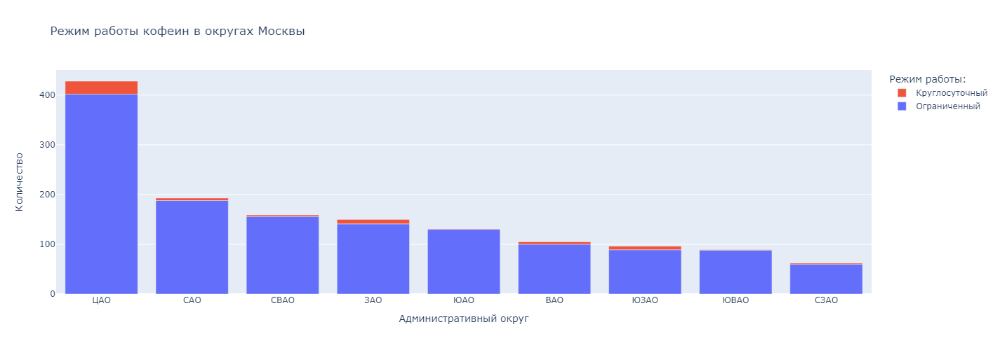

In [109]:
# Диаграмма работы кофеин в округах Москвы

df_time_dist = data.query("category == 'кофейня'").pivot_table(index=['district','is_24/7'], values='name', aggfunc={'name':'count'}).reset_index()
df_time_dist.columns = ['district', 'is_24/7', 'count']
df_time_dist = df_time_dist.sort_values(['count', 'district'], ascending=False)
df_time_dist = df_time_dist.replace({'district':rename_dict, 'is_24/7':time_dict})

fig = px.bar(df_time_dist, x='district', y='count',
            color='is_24/7',
            title = 'Режим работы кофеин в округах Москвы', 
            height=500, width=900,
            labels={
                     "count": "Количество",
                     "district": "Административный округ"
                 })
fig.update_layout(legend_title='Режим работы:',
                  legend_traceorder="reversed")
fig.show()

In [110]:
# Построим фоновую картограмму для отображения кофеин и их рейтинга

df_cof_rate = data.query('category == "кофейня"').groupby(['district'], as_index=False).agg({'rating':'mean'})
df_cof_rate = df_cof_rate.sort_values('rating', ascending=False).reset_index(drop=True)

display(df_cof_rate)

m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')


marker_cluster = MarkerCluster().add_to(m)

def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} Rating:{row['rating']}",
    ).add_to(marker_cluster)

data.query('category == "кофейня"').apply(create_clusters, axis=1)

Choropleth(
    geo_data=geo_json,
    data=df_cof_rate,
    columns=['district', 'rating'],
    locations='district',
    hover_data=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    line_opacity=0.2,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

,district,rating
0,Центральный административный округ,4.336449
1,Северо-Западный административный округ,4.325806
2,Северный административный округ,4.291710
3,Юго-Западный административный округ,4.283333
4,Восточный административный округ,4.282857
5,Южный административный округ,4.232824
6,Юго-Восточный административный округ,4.225843
7,Северо-Восточный административный округ,4.216981
8,Западный административный округ,4.195333


Кофейни нельзя отнести строго к сетевому или частному типу, т.к. имеют одинаковые доли в обоих группах. В свою очередь кофейни - самая популярная категория среди всех сетей общественного питания опережая рестораны и пиццерии. 

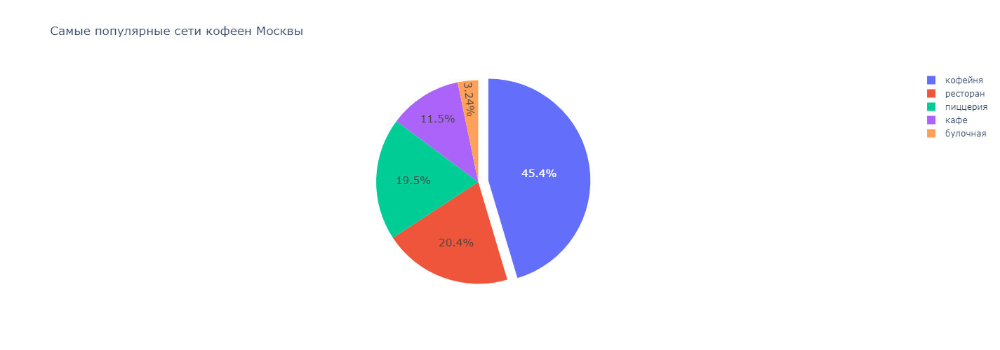

In [111]:
# Построим диаграмму самых популярных категорий заведений среди сетевиков.

fig = go.Figure(data=[go.Pie(labels=df_top_name['category'], 
                             values=df_top_name['count'], 
                             direction="clockwise",
                             textfont_size=15,
                             pull=[0.1])])
fig.update_layout(
        title="Самые популярные сети кофеен Москвы",
        autosize=False,
        width=800,
        height=500)
fig.show()

Топ - 5 брендов кофеин в Москве:  
- Шоколадница, 
- One Price Coffee, 
- Cofix, 
- КОФЕПОРТ, 
- CofeFest.  

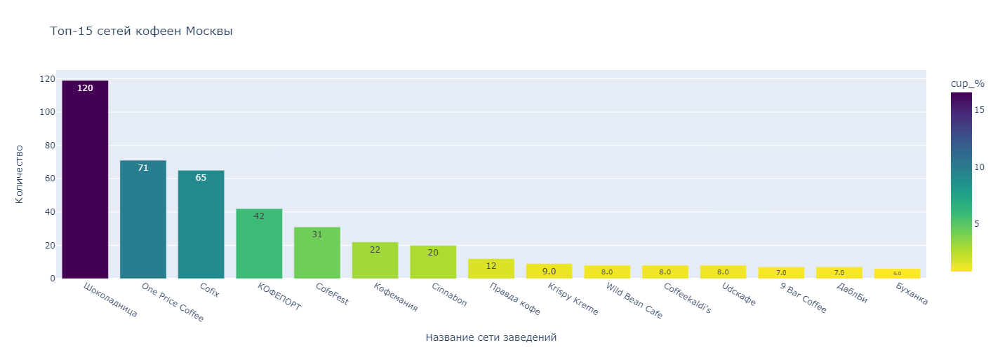

In [112]:
df_top_name = data[(data['chain'] == True) & (data['category']=="кофейня")].groupby(['name', 'category']).agg({'name':'count'}).rename(columns={'name':'count'}).reset_index()
df_top_name['cup_%'] = (100*df_top_name['count']/df_top_name['count'].sum()).round(2)
df_top_name = df_top_name.sort_values('count', ascending=False).reset_index(drop=True).head(15)
fig = px.bar(df_top_name, x='name', y='count',
             text='count', color='cup_%',
             title = 'Топ-15 сетей кофеен Москвы', height=500, width=900,
             color_continuous_scale='viridis_r',
             hover_data=['category','cup_%'],
             labels={
                     "count": "Количество",
                     "name": "Название сети заведений"
                 })
fig.update_traces(texttemplate='%{text:.2s}', textposition='inside')
fig.show()

Топ-5 улиц по количеству кофеин:  
Проспект Мира,  
Ленинградский проспект,  
Ленинский проспект,  
Профсоюзная улица,  
Каширское шоссе.   

Меньше всего на МКАДе, улице Миклухо-Маклая, Пятницкой улице.

В Москве 83 улицы с одной кофейней.  

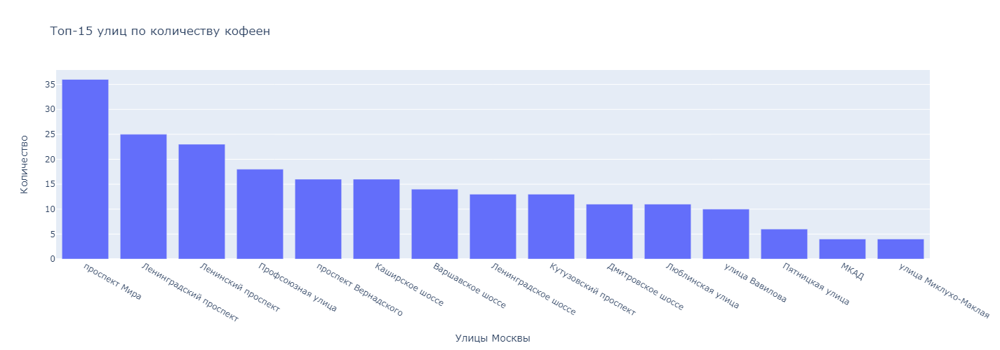

In [113]:

fig = px.bar(df_top_str.query("category == 'кофейня'").sort_values('count', ascending=False), x='street', y='count',
            color='category',
            title = 'Топ-15 улиц по количеству кофеен', 
            height=500, width=900,
            labels={
                     "count": "Количество",
                     "street": "Улицы Москвы"
                 })

fig.update_layout(showlegend=False)

fig.show()

In [114]:
# Рассчитаем медианную цену чашки капучино

df_coffee_cup = data.query('category == "кофейня"').groupby('district')['middle_coffee_cup'].median().reset_index()
df_coffee_cup = df_coffee_cup.sort_values('middle_coffee_cup', ascending = False)
df_coffee_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


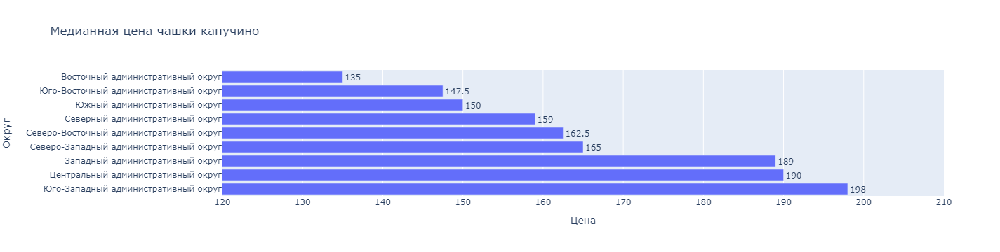

In [115]:
# Построим график медианной цены чашки кофе

fig = px.bar(df_coffee_cup, 
             x='middle_coffee_cup', 
             y='district',
             text='middle_coffee_cup', 
             title='Медианная цена чашки капучино')
            
fig.update_traces(texttemplate='%{text}', textposition='outside')
fig.update_layout(yaxis_title='Округ',
                  xaxis_title='Цена',
                  xaxis=dict(range=[120, 210]),
                  showlegend=False, legend_title='Округ')
fig.show() 

Цена чашки капучино в Москве варьируется от 135 до 200 руб. При открытиии кофейни в Юго-Западном округе стоит ориентироваться на цену в 198 руб. Если рассматривать Западный и Центральный округа, то цена чашки кофе в них не должна сильно превышать 190 руб. Самая низкая цена в Восточном административном округе - 135 руб за чашку. Остальные округа Москвы готовы предложить цену в 147 - 165 руб.

**Чтобы обеспечить успех проекта по открытию кофеен нужно учесть несколько факторов. ** 

1. **Местоположение объекта.**  
Согласно нашим данным, больше всего кофеин в Центральном административном округе, особенно на Проспекте Мира. Это может быть хорошим вариантом, если мы хотим привлечь много посетителей и создать атмосферу городской жизни. Однако, мы можем столкнуться с большой конкуренцией и высокой арендной платой. Поэтому, есть вариант открыть кофейню в более спокойном и уютном районе. Например, можем рассмотреть Северо-Западный или Северный административный округ, где кофеини имеют высокий рейтинг, но их меньшее количество. Также, можно поискать улицы с одной кофейней, чтобы выделиться среди других заведений.  

2. **Целевая аудитория.**  
Надо знать кто наши основные клиенты: студенты, офисные работники, туристы, жители района? Исходя из этого, следует выбирать место, которое будет удобно и привлекательно для них. Например, если мы хотим обслуживать студентов, то стоит рассмотреть локации рядом с университетами, библиотеками, хостелами. Если мы хотим обслуживать офисных работников, то стоит рассмотреть локации рядом с бизнес-центрами, метро, остановками общественного транспорта. А если мы хотим обслуживать туристов, то стоит рассмотреть локации рядом с достопримечательностями, гостиницами, пешеходными зонами.  

3. **Выбор концепции.**  
Нужно определить концепцию и стиль нашей кофейни. Если инвесторы вдохновились дизайном и интерьером «Central Perk»,то можно использовать красные кирпичные стены и другие элементы, чтобы создать уютную и дружескую атмосферу. Можно также добавить некоторые отсылки к сериалу, например, логотип «Central Perk», фотографии или цитаты персонажей, или даже живую музыку, как в сериале. Однако, мы должны учитывать вкусы местной аудитории, которая может не быть поклонницей «Друзей». Поэтому можно посоветовать сделать опрос или дополнительное исследование, чтобы выяснить, что предпочитают потенциальные клиенты, и адаптировать нашу концепцию под их ожидания.  

4. **Выбор ценовой политики и ассортимента.**  
В Москве цены на капучино разнятся в зависимости от района. Если открывать кофейню на Юго-Западе, то стоит ориентироваться на цену в 198 рублей. В Западном и Центральном округах цена не должна сильно превышать 190 рублей. Восточный административный округ предлагает самую низкую цену - 135 рублей за чашку. В остальных округах цена варьируется от 147 до 165 рублей. Мы можем установить свои цены в этом диапазоне или немного выше, если хотим позиционировать себя как премиальный бренд. Однако должны быть осторожны, чтобы не отпугнуть своих потенциальных клиентов слишком высокими ценами. Здесь надо внимательно следить за качеством кофе и выбирать только проверенных поставщиков. Также мы можем предлагать скидки и акции для постоянных клиентов и групп друзей, чтобы повысить их лояльность и привлечь новых посетителей.



Презентация: [Рынок заведений общественного питания Москвы](https://disk.yandex.ru/i/ScsyUlvfXP0Ctw)